# Python for Data Science Project


### For this analysis I selected the open dataset from __[Kaggle.com](https://www.kaggle.com/roshansharma/sanfranciso-crime-dataset)__ which is maintained by Roshan Sharma. This dataset contains incidents recorded by the San Francisco police department for year 2016. It consists of more than 150,000 reported incidents including details about their classification, time, location and resolution status. 

In this analysis I will seek to answer the following questions through data analysis and visualization techniques: 
1. Is there a pattern to crime in San Francisco? 
2. Are particular discricts prone to specific types of crimes, i.e., Hotspots? 

## Import Required Libraries

In [1]:
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import folium
%matplotlib inline

import seaborn as sns
sns.set()

## 1. Import Dataset using Pandas

In [2]:
# Show current working directory and list contents of directory
#
#!pwd; ls

In [3]:
# Read data from downloaded csv file
#
raw_data = pd.read_csv('Police_Department_Incidents_-_Previous_Year__2016_.csv')
raw_data

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,120058272,WEAPON LAWS,POSS OF PROHIBITED WEAPON,Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212120
1,120058272,WEAPON LAWS,"FIREARM, LOADED, IN VEHICLE, POSSESSION OR USE",Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212168
2,141059263,WARRANTS,WARRANT ARREST,Monday,04/25/2016 12:00:00 AM,14:59,BAYVIEW,"ARREST, BOOKED",KEITH ST / SHAFTER AV,-122.388856,37.729981,"(37.7299809672996, -122.388856204292)",14105926363010
3,160013662,NON-CRIMINAL,LOST PROPERTY,Tuesday,01/05/2016 12:00:00 AM,23:50,TENDERLOIN,NONE,JONES ST / OFARRELL ST,-122.412971,37.785788,"(37.7857883766888, -122.412970537591)",16001366271000
4,160002740,NON-CRIMINAL,LOST PROPERTY,Friday,01/01/2016 12:00:00 AM,00:30,MISSION,NONE,16TH ST / MISSION ST,-122.419672,37.765050,"(37.7650501214668, -122.419671780296)",16000274071000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
150495,161061000,ASSAULT,BATTERY,Friday,12/30/2016 12:00:00 AM,21:01,PARK,NONE,OAK ST / STANYAN ST,-122.453982,37.771428,"(37.7714278595913, -122.453981622365)",16106100004134
150496,176000742,NON-CRIMINAL,LOST PROPERTY,Friday,12/30/2016 12:00:00 AM,08:00,CENTRAL,NONE,JACKSON ST / SANSOME ST,-122.401857,37.796626,"(37.7966261239618, -122.401857374739)",17600074271000
150497,176000758,LARCENY/THEFT,PETTY THEFT OF PROPERTY,Thursday,12/29/2016 12:00:00 AM,20:00,CENTRAL,NONE,PINE ST / TAYLOR ST,-122.412269,37.790673,"(37.7906727649886, -122.41226909106)",17600075806372
150498,176000764,LARCENY/THEFT,GRAND THEFT OF PROPERTY,Friday,12/30/2016 12:00:00 AM,10:00,CENTRAL,NONE,200 Block of STOCKTON ST,-122.406659,37.788275,"(37.7882745285785, -122.406658711008)",17600076406374


In [4]:
print ('Dataframe has {} rows and {} columns'.format(raw_data.shape[0], raw_data.shape[1]))

Dataframe has 150500 rows and 13 columns


## 2. Preliminary Exploration of Data

In [5]:
# Show All Column headings
#
raw_data.columns

Index(['IncidntNum', 'Category', 'Descript', 'DayOfWeek', 'Date', 'Time',
       'PdDistrict', 'Resolution', 'Address', 'X', 'Y', 'Location', 'PdId'],
      dtype='object')

In [6]:
# Examine Descriptive Statistics for data set
#
raw_data.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
IncidntNum,150500,NaN,NaN,NaN,1.61644e+08,5.53598e+06,1.13512e+07,1.60328e+08,1.60654e+08,1.60976e+08,9.91009e+08
Category,150500,39,LARCENY/THEFT,40409,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Descript,150500,726,GRAND THEFT FROM LOCKED AUTO,17741,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DayOfWeek,150500,7,Friday,23371,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Date,150500,366,01/01/2016 12:00:00 AM,558,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Time,150500,1439,12:00,3842,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PdDistrict,150499,10,SOUTHERN,28445,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Resolution,150500,14,NONE,107780,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Address,150500,16130,800 Block of BRYANT ST,3561,NaN,NaN,NaN,NaN,NaN,NaN,NaN
X,150500,NaN,NaN,NaN,-122.424,0.0262103,-122.514,-122.434,-122.417,-122.407,-122.366


In [7]:
# Show total crime numbers for each Category, DayOfWeek, PdDistrict & Resolution type
#
for category in ['Category', 'DayOfWeek', 'PdDistrict', 'Resolution']:
    print ('\nThere are {} unique values for {}'.format(len(raw_data[category].unique()), category))
    print(raw_data[category].value_counts())


There are 39 unique values for Category
LARCENY/THEFT                  40409
OTHER OFFENSES                 19599
NON-CRIMINAL                   17866
ASSAULT                        13577
VANDALISM                       8589
VEHICLE THEFT                   6419
WARRANTS                        5914
BURGLARY                        5802
SUSPICIOUS OCC                  5782
MISSING PERSON                  4338
DRUG/NARCOTIC                   4243
ROBBERY                         3299
FRAUD                           2635
SECONDARY CODES                 1841
TRESPASS                        1812
WEAPON LAWS                     1658
SEX OFFENSES, FORCIBLE           940
STOLEN PROPERTY                  882
RECOVERED VEHICLE                736
DISORDERLY CONDUCT               658
PROSTITUTION                     641
FORGERY/COUNTERFEITING           619
DRUNKENNESS                      465
DRIVING UNDER THE INFLUENCE      378
ARSON                            286
KIDNAPPING                       2

### Initial Observations
1. PdDistrict has one observation less than the other features
2. There are 39 Unique Categories of reported crimes with Larceny/Theft being the most common
3. Friday is the day with the most reported crimes but by a small margin
4. 107,780 out to 150,500 crimes have no resolution and respresents the largest percentage
5. There are 10 unique PdDistricts where crimes were reported

In [8]:
# Check data types
#
raw_data.dtypes

IncidntNum      int64
Category       object
Descript       object
DayOfWeek      object
Date           object
Time           object
PdDistrict     object
Resolution     object
Address        object
X             float64
Y             float64
Location       object
PdId            int64
dtype: object

## 3. Data Wrangling

In [9]:
# Create data checkpoint
#
data = raw_data.copy()
#data.head()

In [10]:
# Convert Date & Time Columns to datetime 
#
data['Date']=pd.to_datetime(data['Date']).dt.date
data['Time']=pd.to_datetime(data['Time']).dt.time

In [11]:
data.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,120058272,WEAPON LAWS,POSS OF PROHIBITED WEAPON,Friday,2016-01-29,11:00:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212120
1,120058272,WEAPON LAWS,"FIREARM, LOADED, IN VEHICLE, POSSESSION OR USE",Friday,2016-01-29,11:00:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212168
2,141059263,WARRANTS,WARRANT ARREST,Monday,2016-04-25,14:59:00,BAYVIEW,"ARREST, BOOKED",KEITH ST / SHAFTER AV,-122.388856,37.729981,"(37.7299809672996, -122.388856204292)",14105926363010
3,160013662,NON-CRIMINAL,LOST PROPERTY,Tuesday,2016-01-05,23:50:00,TENDERLOIN,NONE,JONES ST / OFARRELL ST,-122.412971,37.785788,"(37.7857883766888, -122.412970537591)",16001366271000
4,160002740,NON-CRIMINAL,LOST PROPERTY,Friday,2016-01-01,00:30:00,MISSION,NONE,16TH ST / MISSION ST,-122.419672,37.765050,"(37.7650501214668, -122.419671780296)",16000274071000


In [12]:
# Check for null values
#
data.isnull().any()

IncidntNum    False
Category      False
Descript      False
DayOfWeek     False
Date          False
Time          False
PdDistrict     True
Resolution    False
Address       False
X             False
Y             False
Location      False
PdId          False
dtype: bool

In [13]:
print('Column PdDistrict contains {} null values'.format(data.PdDistrict.isnull().sum()))

Column PdDistrict contains 1 null values


In [14]:
# Drop Null Values from Dataframe
#
data.dropna(inplace=True)

### 3.1 - Group Original 39 Categories of Crime into 8 Broader Categories
groupings guided by the following article along with accepted legal definitions. __[Saylor Academy: Social Problems : Continuity and Change, 2012](https://saylordotorg.github.io/text_social-problems-continuity-and-change/s11-02-types-of-crime.html)__

In [15]:
# Show current Categories
#
data['Category'].unique()

array(['WEAPON LAWS', 'WARRANTS', 'NON-CRIMINAL', 'ASSAULT',
       'OTHER OFFENSES', 'MISSING PERSON', 'LARCENY/THEFT', 'BURGLARY',
       'STOLEN PROPERTY', 'ROBBERY', 'FRAUD', 'DRUG/NARCOTIC',
       'VEHICLE THEFT', 'RECOVERED VEHICLE', 'VANDALISM', 'ARSON',
       'PROSTITUTION', 'SECONDARY CODES', 'SUSPICIOUS OCC', 'DRUNKENNESS',
       'TRESPASS', 'SEX OFFENSES, NON FORCIBLE', 'SEX OFFENSES, FORCIBLE',
       'RUNAWAY', 'KIDNAPPING', 'DISORDERLY CONDUCT',
       'DRIVING UNDER THE INFLUENCE', 'FORGERY/COUNTERFEITING',
       'EMBEZZLEMENT', 'BRIBERY', 'FAMILY OFFENSES', 'GAMBLING',
       'SUICIDE', 'LIQUOR LAWS', 'EXTORTION', 'LOITERING', 'TREA',
       'BAD CHECKS', 'PORNOGRAPHY/OBSCENE MAT'], dtype=object)

In [16]:
# Create new grouping by combining categories into the following groups: 
#  (Violent, Property, White Collar, Organized, Public Order, Misdemeanor, Domestic & Other)
#
grouping = {'ASSAULT': 'Violent', 'KIDNAPPING': 'Violent', 'SEX OFFENSES, FORCIBLE': 'Violent', 
            'ARSON': 'Property', 'LARCENY/THEFT': 'Property', 'BURGLARY': 'Property', 'STOLEN PROPERTY': 'Property', 'ROBBERY': 'Property', 'VEHICLE THEFT': 'Property','TRESPASS': 'Property', 'RECOVERED VEHICLE': 'Property','VANDALISM': 'Property', 'TREA': 'Property', 'EXTORTION':'White Collar',
            'FRAUD':'White Collar','EMBEZZLEMENT':'White Collar','BRIBERY':'White Collar', 'BAD CHECKS':'White Collar', 'FORGERY/COUNTERFEITING':'White Collar',
            'DRUG/NARCOTIC':'Organized', 
            'DISORDERLY CONDUCT': 'Public Order', 'DRIVING UNDER THE INFLUENCE': 'Public Order', 'DRUNKENNESS':'Public Order', 'PROSTITUTION':'Public Order', 'LIQUOR LAWS':'Public Order', 'GAMBLING':'Public Order', 'SEX OFFENSES, NON FORCIBLE': 'Public Order', 'PORNOGRAPHY/OBSCENE MAT':'Public Order', 'WEAPON LAWS': 'Public Order', 
            'FAMILY OFFENSES': 'Domestic', 'RUNAWAY':'Domestic',
            'NON-CRIMINAL': 'Misdemeanor', 'LOITERING': 'Misdemeanor', 
            'MISSING PERSON': 'Other', 'WARRANTS':'Other', 'OTHER OFFENSES': 'Other', 'SECONDARY CODES': 'Other', 'SUSPICIOUS OCC': 'Other', 'SUICIDE': 'Other', 
            }

In [17]:
# Add new Column to table with Parent Category
#
data['ParentCategory']=data['Category'].map(grouping)

### 3.2 - Split Resolution Column into Two Categories

In [18]:
# Show unique elements of Resolution Feature
#
print(data.Resolution.unique())

['ARREST, BOOKED' 'NONE' 'JUVENILE BOOKED' 'ARREST, CITED' 'UNFOUNDED'
 'JUVENILE DIVERTED' 'CLEARED-CONTACT JUVENILE FOR MORE INFO'
 'EXCEPTIONAL CLEARANCE' 'LOCATED' 'PSYCHOPATHIC CASE'
 'COMPLAINANT REFUSES TO PROSECUTE' 'NOT PROSECUTED'
 'PROSECUTED BY OUTSIDE AGENCY' 'JUVENILE CITED']


In [19]:
# Create new feature: Resolved to show unresolved issues
#
data['Resolved'] = ['Un-Resolved' if resolution=='NONE' else 'Resolved' for resolution in data['Resolution']]

### 3.3 - Generate columns for Hour & Month

In [20]:
# Employ lambda function to create new column for Hour
#
data['Hour'] = data['Time'].apply(lambda x : x.hour)
data['Month'] = data['Date'].apply(lambda x : x.month)

In [21]:
# Rearrange Dataframe Columns
#
data.columns

Index(['IncidntNum', 'Category', 'Descript', 'DayOfWeek', 'Date', 'Time',
       'PdDistrict', 'Resolution', 'Address', 'X', 'Y', 'Location', 'PdId',
       'ParentCategory', 'Resolved', 'Hour', 'Month'],
      dtype='object')

In [22]:
data = data[['IncidntNum', 'ParentCategory', 'Category', 'Descript', 'DayOfWeek', 'Date','Month', 'Time',
       'Hour', 'PdDistrict', 'Resolution', 'Resolved', 'Address', 'X', 'Y', 'Location', 'PdId',
       ]]

### 3.4 - Drop Duplicates for Map Visualization

An inspection of the data shows there are multiple observations in the dataset with the same Incident Number, Time and Location but with multiple Categories. Create a new dataframe with no duplicates for visual analysis to follow

In [23]:
# Drop duplicates from dataframe for map visualization
#
data_map = data.drop_duplicates(subset='IncidntNum', keep='first', ignore_index=True)
print('{} duplicates were dropped from the dataset'.format(len(data)-len(data_map)))

33801 duplicates were dropped from the dataset


In [24]:
data.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
IncidntNum,150499,NaN,NaN,NaN,1.61644e+08,5.53598e+06,1.13512e+07,1.60328e+08,1.60654e+08,1.60976e+08,9.91009e+08
ParentCategory,150499,8,Property,68236,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Category,150499,39,LARCENY/THEFT,40408,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Descript,150499,726,GRAND THEFT FROM LOCKED AUTO,17740,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DayOfWeek,150499,7,Friday,23371,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Date,150499,366,2016-01-01,558,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Month,150499,NaN,NaN,NaN,6.53917,3.4738,1,4,7,10,12
Time,150499,1439,12:00:00,3842,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Hour,150499,NaN,NaN,NaN,13.4339,6.44524,0,9,14,19,23
PdDistrict,150499,10,SOUTHERN,28445,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Dataset is ready for analysis and visualization..

## 4. Analyze Data

### 4.1 - Visualize Crime Locations on San Francisco Map

In [25]:
sf_lat, sf_long = data_map.Y.mean(), data_map.X.mean()

In [26]:
# Create function to plot filtered data based on arguments specified
# the function filters the dataframe for Column=Value then plots locations 
#
def map_crime_filter(Column, Value):
    '''
    This function takes as arguments a column name and value,
    then filters the dataframe to show only matching values for 
    that column and finally displays locations on a map of SF.
    '''
    dataframe_filtered = data_map[data_map[Column]==Value]
    sanfran_map_filtered = folium.Map(location=[sf_lat, sf_long], zoom_start=12)
    for lat, long in zip(dataframe_filtered.Y, dataframe_filtered.X):
        folium.CircleMarker([lat, long],
                           radius=1,
                           fill=True,
                           fill_color='blue',
                           fill_opacity= 0.5).add_to(sanfran_map_filtered)
    print ('There were {} reports for {} = {} in San Francisco for 2016'.format(dataframe_filtered.shape[0], Column, Value))
    return sanfran_map_filtered

In [27]:
# Show unique Parent Categories defined above
#
data_map.ParentCategory.unique()

array(['Public Order', 'Other', 'Misdemeanor', 'Violent', 'Property',
       'White Collar', 'Organized', 'Domestic'], dtype=object)

In [28]:
# Visualize Maps for each Broad Parent Category of Crime defined during wrangling
# ----maps are visualized one at a time to keep notebook size small----
# ------------------uncomment to view specific map---------------------
#
#map_crime_filter('ParentCategory', 'Public Order')
#map_crime_filter('ParentCategory', 'Other')
#map_crime_filter('ParentCategory', 'Misdemeanor')
map_crime_filter('ParentCategory', 'Violent')
##map_crime_filter('ParentCategory', 'Property')
#map_crime_filter('ParentCategory', 'White Collar')
#map_crime_filter('ParentCategory', 'Organized')
#map_crime_filter('ParentCategory', 'Domestic')
#

There were 10381 reports for ParentCategory = Violent in San Francisco for 2016


In [29]:
# Explore other filtered maps
# uncomment appropriate line to view
#

# Plot locations for Crimes reported on Friday
#map_crime_filter('DayOfWeek', 'Friday')


# Plot locations for Crimes reported in SOUTHERN District
map_crime_filter('PdDistrict', 'TENDERLOIN')


# Plot locations for Crimes with no Resolution
#map_crime_filter('Resolution', 'NONE')

There were 7038 reports for PdDistrict = TENDERLOIN in San Francisco for 2016


### 4.1 - Analyze Total Crime Reported per District, Day, Category, Month & Hour

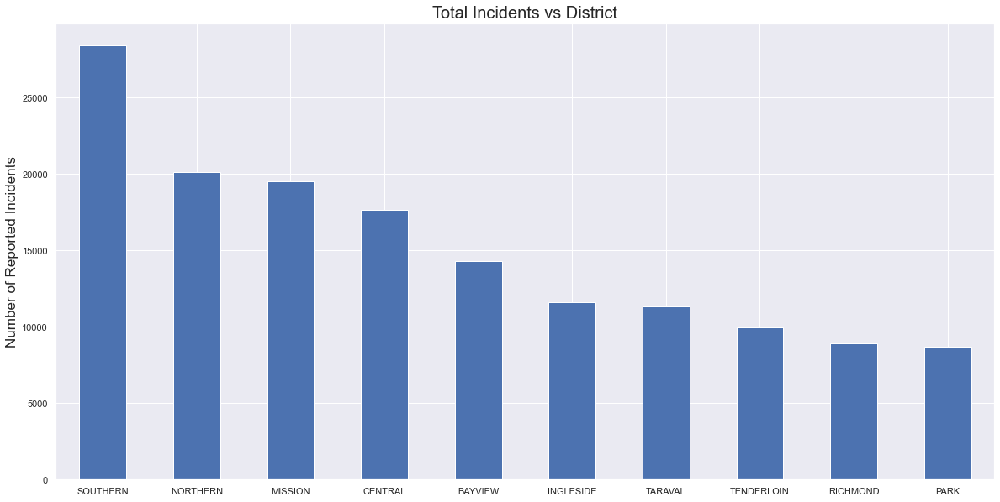

In [30]:
# Explore the total reported incidents vs District
#
barplot = data.groupby(by='PdDistrict').count().sort_values(by='IncidntNum', ascending=False)
barplot['IncidntNum'].plot(kind='bar', legend=None, figsize=(20,10))
plt.title('Total Incidents vs District', fontsize=20)
plt.ylabel('Number of Reported Incidents', fontsize=17)
plt.xlabel(None)
plt.xticks(rotation=0)
plt.show()

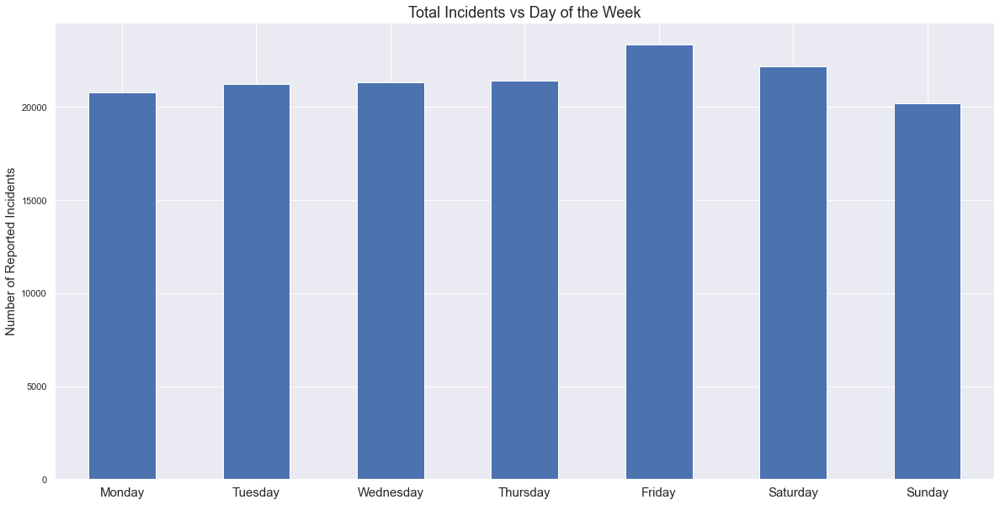

In [31]:
# Explore the total reported incidents vs day of the week
#
barplot=data.groupby(by='DayOfWeek').count()
weekday_order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
barplot = barplot.reindex(weekday_order)
#barplot.head()
barplot['IncidntNum'].plot(kind='bar', figsize=(20,10))
plt.title('Total Incidents vs Day of the Week', fontsize=18)
plt.ylabel('Number of Reported Incidents', fontsize=15)
plt.xlabel(None)
plt.xticks(rotation=0, fontsize=15)
plt.show()

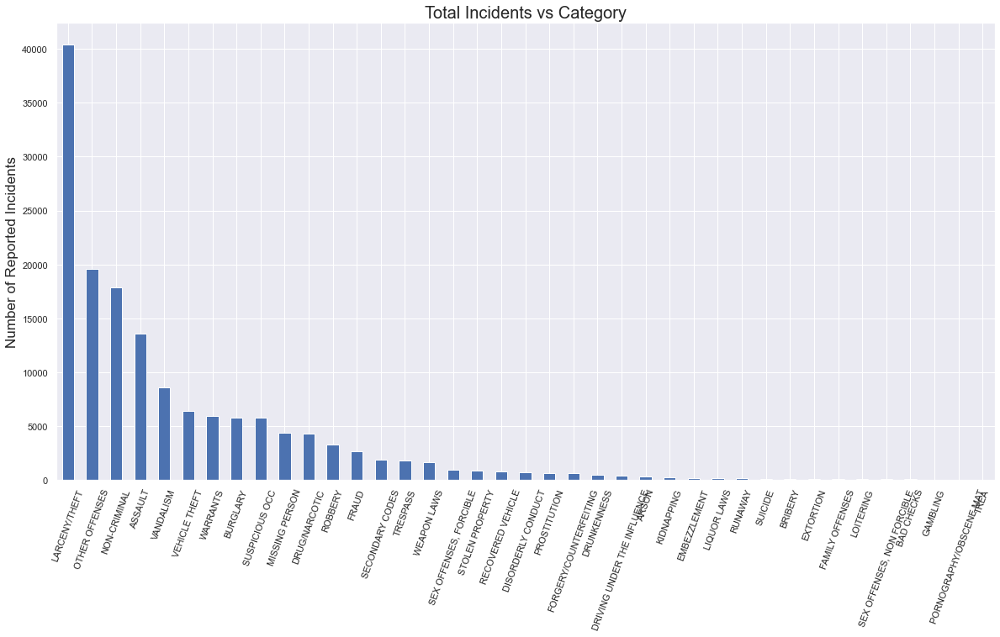

In [32]:
# Explore the total reported incidents vs crime Category
#
barplot = data.groupby(by='Category').count().sort_values(by='IncidntNum', ascending=False)
barplot['IncidntNum'].plot(kind='bar', legend=None, figsize=(20,10))
plt.title('Total Incidents vs Category', fontsize=20)
plt.ylabel('Number of Reported Incidents', fontsize=17)
plt.xlabel(None)
plt.xticks(rotation=70)
plt.show()

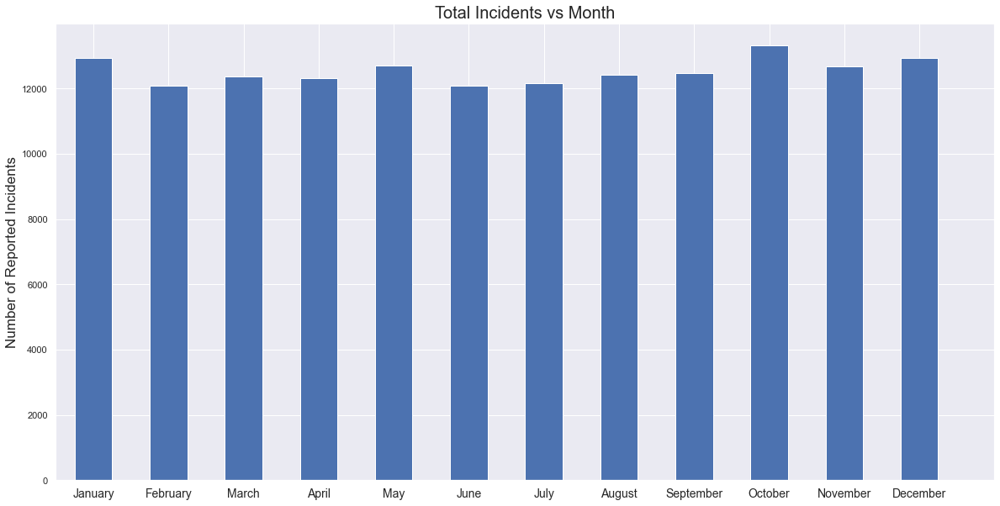

In [33]:
# Explore the total reported incidents vs month of the year
#
data.groupby(by='Month', as_index=True).count()['IncidntNum'].plot(kind='bar', figsize=(20,10), legend=None)
plt.title('Total Incidents vs Month', fontsize=20)
plt.ylabel('Number of Reported Incidents', fontsize=17)
months_of_year = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
plt.xticks(ticks=range(0,13), labels=months_of_year, rotation=0, fontsize=14)
plt.xlabel(None)
plt.show()

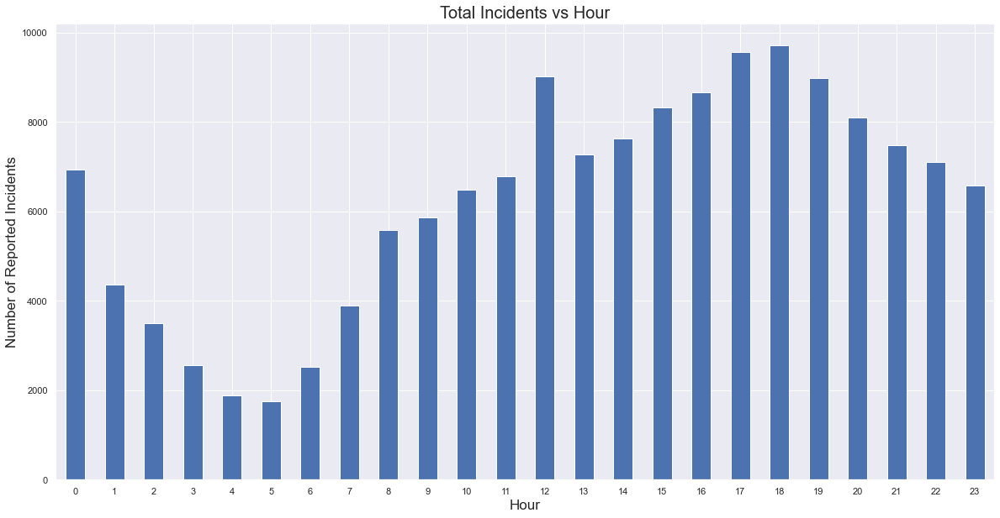

In [34]:
# Explore the total reported incidents vs Hour of the day
#
data.groupby(by='Hour', as_index=False).count().plot(kind='bar', x='Hour', y='IncidntNum', figsize=(20,10), legend=None)
plt.title('Total Incidents vs Hour', fontsize=20)
plt.ylabel('Number of Reported Incidents', fontsize=17)
plt.xlabel('Hour', fontsize=17)
plt.xticks(rotation=0)
plt.show()

In [35]:
# Explore Categories of Crime for a Single Month of the Year
# --uncomment to view---
#
#data[data.Month==12].groupby(by='ParentCategory', as_index=False).count().plot(kind='bar', x='ParentCategory', y='IncidntNum', legend=None, figsize=(20,10))

In [36]:
# Explore Categories of Crime for a Single Hour of the Day
# --uncomment to view---
#
#data[data.Hour==12].groupby(by='ParentCategory', as_index=False).count().plot(kind='bar', x='ParentCategory', y='IncidntNum', legend=None, figsize=(20,10))

### 4.2 - Analyze Breakdown of Crime Categories per Hour, District and Day of the Week

In [37]:
def dataframe_by_feature(feature):
    '''
    This function takes as argument a feature and returns a the SF crime data
    with its rows as feature elements, columns as the 8 defined crime categories and 
    value as the number of reported incidents for each feaure and category
    '''
    # Group dataframe by selected feature and ParentCategory then aggregate by count function
    grouped = data.groupby(by=[feature,'ParentCategory'], as_index=False).count()
    # Create base dataframe
    df = pd.DataFrame({'ParentCategory':['Public Order','Domestic','Misdemeanor','Organized','Other','Property','Violent','White Collar']})
    # For each unique feature:
    # - filter dataframe for feature
    # - extract required columns
    # - rename columns
    # - merge to base dataframe
    for element in sorted(grouped[feature].unique()):
        temp_df = grouped[grouped[feature]==element][['ParentCategory','IncidntNum']]
        temp_df.rename(columns={'IncidntNum':element}, inplace=True)
        df=df.merge(temp_df, on='ParentCategory', how='inner').set_index('ParentCategory')
    # Return transpose of merged dataframe
    return df.transpose()

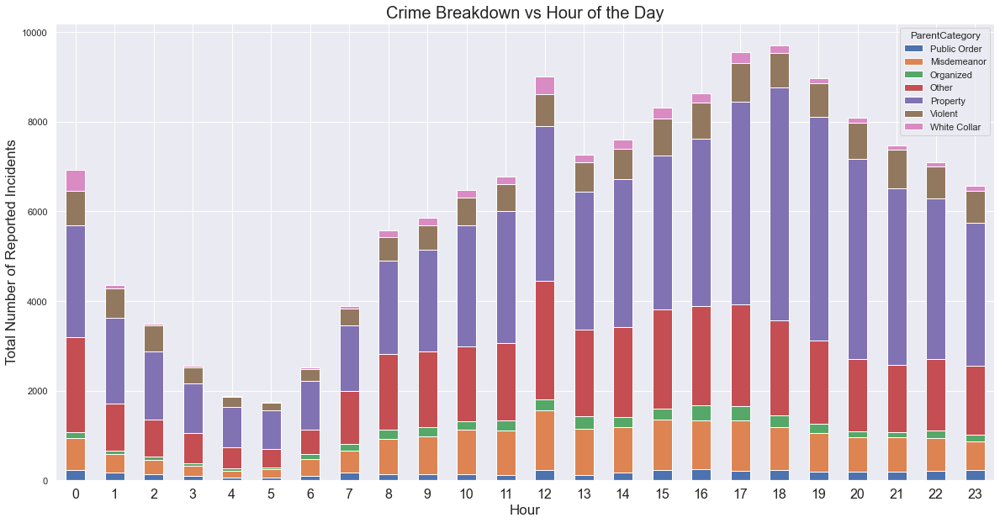

In [38]:
# Examine Breakdown of Crime Categories per Hour of the Day
# Bar Plot
#
dataframe_by_feature('Hour').plot(kind='bar', stacked=True, figsize=(20,10))
plt.title('Crime Breakdown vs Hour of the Day', fontsize=(20))
plt.ylabel('Total Number of Reported Incidents', fontsize=17)
plt.xlabel('Hour', fontsize=17)
plt.xticks(rotation=0, fontsize=16)
plt.show()

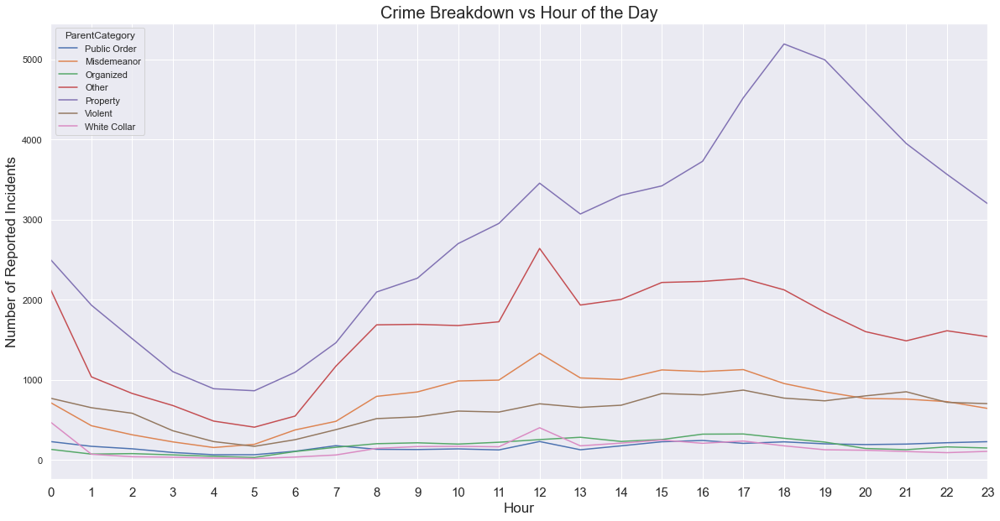

In [39]:
# Examine Breakdown of Crime per Hour of the Day
# Line Plot
#
dataframe_by_feature('Hour').plot(kind='line', stacked=False, figsize=(20,10))
plt.title('Crime Breakdown vs Hour of the Day', fontsize=(20))
plt.ylabel('Number of Reported Incidents', fontsize=17)
plt.xlabel('Hour', fontsize=17)
plt.xticks(ticks=range(0,24),rotation=0, fontsize=15)
plt.xlim(0,23)
plt.show()

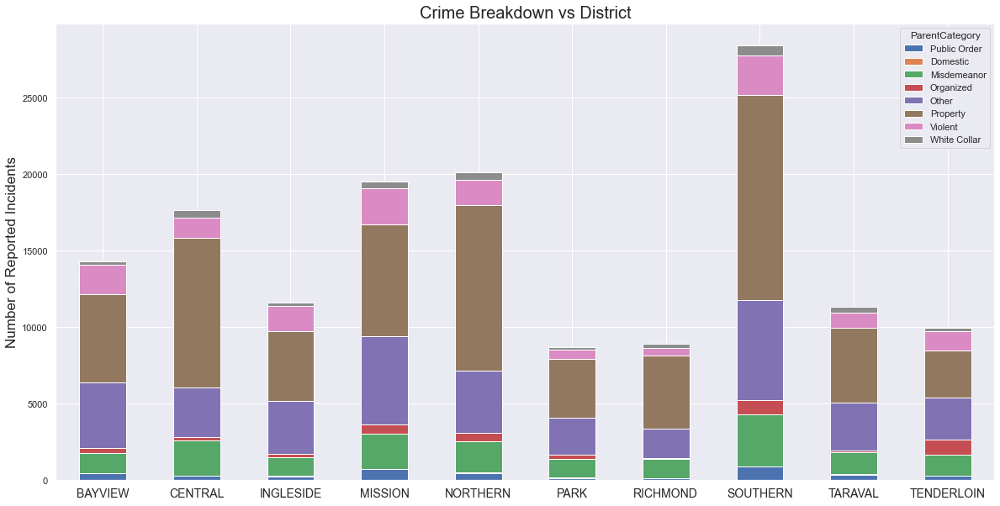

In [40]:
# Examine Breakdown of Crime Categories per District
# Bar Plot
#
dataframe_by_feature('PdDistrict').plot(kind='bar', stacked=True, figsize=(20,10))
plt.title('Crime Breakdown vs District', fontsize=(20))
plt.ylabel('Number of Reported Incidents', fontsize=17)
plt.xticks(rotation=0, fontsize=14)
plt.show()

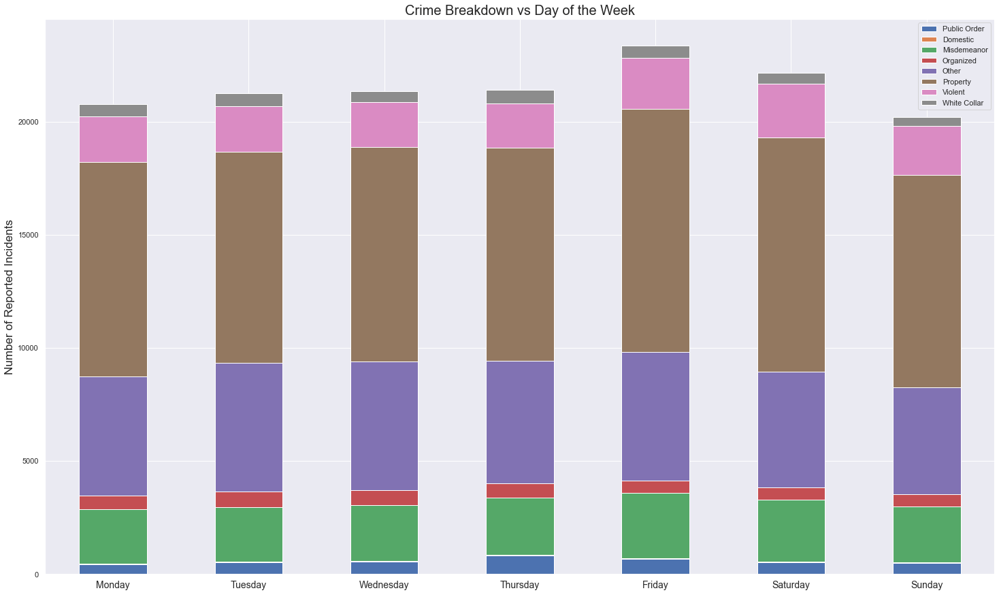

In [41]:
# Examine Breakdown of Crime Categories per Day of the Week
# Bar Plot
#
dataframe_by_feature('DayOfWeek').reindex(weekday_order).plot(kind='bar', stacked=True, figsize=(25,15))
plt.title('Crime Breakdown vs Day of the Week', fontsize=(20))
plt.ylabel('Number of Reported Incidents', fontsize=17)
plt.legend(loc='upper right')
plt.xticks(rotation=0, fontsize=14)
plt.show()

### 4.3 - Analyze Percentages of Crime Categories in Each District

In [42]:
# Generate dataframe using function defined above
df = dataframe_by_feature('PdDistrict').transpose()

# Replace counts with percentages
for column in df.columns:
    df[column]=round(100*df[column]/df[column].sum(axis=0),2)

df 

,BAYVIEW,CENTRAL,INGLESIDE,MISSION,NORTHERN,PARK,RICHMOND,SOUTHERN,TARAVAL,TENDERLOIN
ParentCategory,,,,,,,,,,
Public Order,3.06,1.56,2.16,3.76,2.40,1.59,1.47,3.15,3.28,3.05
Domestic,0.28,0.04,0.17,0.10,0.06,0.36,0.12,0.05,0.29,0.05
Misdemeanor,9.19,13.13,10.69,11.62,10.26,14.29,13.98,11.99,12.58,13.87
Organized,2.29,1.17,1.65,3.28,2.62,3.15,0.85,3.24,0.95,9.77
Other,29.74,18.35,30.07,29.59,20.14,27.80,21.35,23.00,27.81,27.44
Property,40.43,55.51,39.33,37.47,53.91,43.94,53.43,47.16,42.99,30.90
Violent,13.44,7.29,14.08,11.92,8.23,6.70,5.85,9.03,8.99,12.65
White Collar,1.57,2.95,1.85,2.27,2.37,2.18,2.95,2.37,3.10,2.27


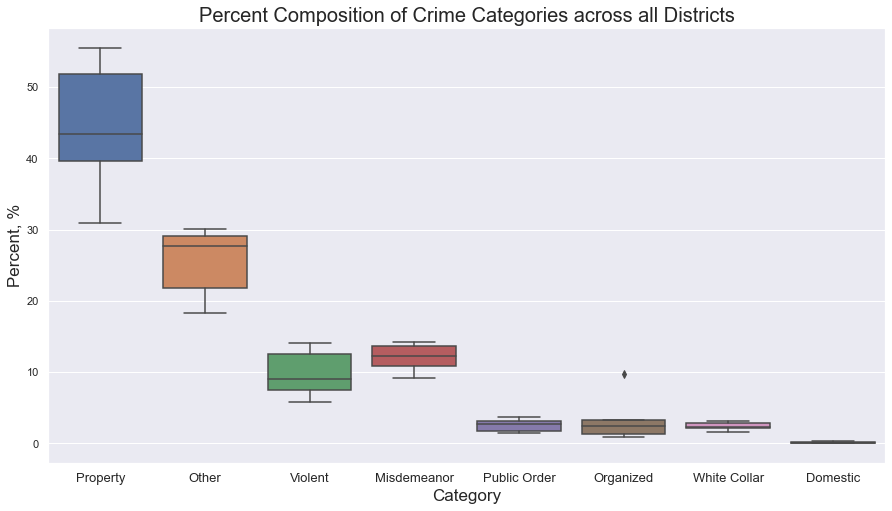

In [43]:
# Box Plot of Percentage of each crime category across all Districts
#
fig=plt.figure(figsize=(15,8))
sns.boxplot(data=df.sort_values(by='BAYVIEW', axis=0, ascending=False).transpose())
plt.title('Percent Composition of Crime Categories across all Districts', fontsize=(20))
plt.ylabel('Percent, %', fontsize=17)
plt.xlabel('Category', fontsize=17)
plt.xticks(fontsize=13)
plt.show()

In [44]:
# Show Districts with the highest percentage of each Parent Category
#
for category in df.index:
    # extract district name from category series
    district = df.loc[category].idxmax()
    # extract max value from category series
    value = df.loc[category].max()
    # calculate average for category
    avg = df.loc[category].mean()
    # calculate standard deviation for category
    stdev = df.loc[category].std()
    # Display results with 'pretty-print' padding
    print('Highest {:<20} : {:<14} {:05.2f}%  >>  {:.1f} xAvg and {:.1f} xStdDev of the category'.format(category+' Crime %', district+' at', value, (value/avg),(value-avg)/stdev))

Highest Public Order Crime % : MISSION at     03.76%  >>  1.5 xAvg and 1.5 xStdDev of the category
Highest Domestic Crime %     : PARK at        00.36%  >>  2.4 xAvg and 1.8 xStdDev of the category
Highest Misdemeanor Crime %  : PARK at        14.29%  >>  1.2 xAvg and 1.2 xStdDev of the category
Highest Organized Crime %    : TENDERLOIN at  09.77%  >>  3.4 xAvg and 2.7 xStdDev of the category
Highest Other Crime %        : INGLESIDE at   30.07%  >>  1.2 xAvg and 1.0 xStdDev of the category
Highest Property Crime %     : CENTRAL at     55.51%  >>  1.2 xAvg and 1.4 xStdDev of the category
Highest Violent Crime %      : INGLESIDE at   14.08%  >>  1.4 xAvg and 1.4 xStdDev of the category
Highest White Collar Crime % : TARAVAL at     03.10%  >>  1.3 xAvg and 1.5 xStdDev of the category


### 4.4 - Analyze Resolved vs Unresolved Categories of Crime

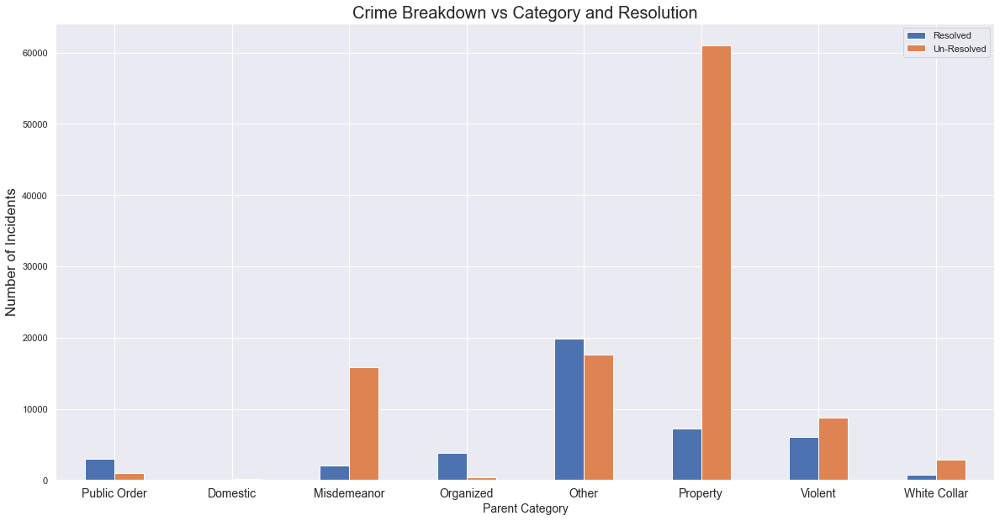

In [45]:
# Generate dataframe using function defined earlier and plot results
#
res_df = dataframe_by_feature('Resolved').transpose()
res_df.plot(kind='bar', figsize=(20,10) )
plt.title('Crime Breakdown vs Category and Resolution', fontsize=(20))
plt.ylabel('Number of Incidents', fontsize=17)
plt.xlabel('Parent Category', fontsize=14)
plt.legend(loc='upper right')
plt.xticks(rotation=0, fontsize=14)
plt.show()

In [46]:
# Sort dataframe in decreasing order by percentage of unresolved crime reports
#
res_df=dataframe_by_feature('Resolved').transpose()
res_df['% Un-Resolved']=(100*res_df['Un-Resolved']/(res_df['Un-Resolved']+res_df['Resolved'])).astype('int')
res_df=res_df.sort_values(by='% Un-Resolved', axis=0, ascending=False)

res_df

,Resolved,Un-Resolved,% Un-Resolved
ParentCategory,,,
Property,7177,61059,89
Misdemeanor,2045,15863,88
Domestic,37,156,80
White Collar,731,2851,79
Violent,6006,8768,59
Other,19876,17667,47
Public Order,2985,1035,25
Organized,3863,380,8


## 5 - General Findings

1. Property crime, including Larceny & Theft is the largest crime category by a large margin
2. The Southern District has the highest number of recorded incidents for 2016
3. The Park District has the fewest number of recorded incidents for 2016
4. More incidents are recorded on Friday by a small margin
5. The month of October had the highest number of recorded incidents for 2016
6. Total Incidents show a cyclical pattern with the highest number of incidents recorded at 18h00 and the fewest at 05h00
7. A obvious spike in crime is observable at 12h00
8. Crime Categories of Property, Misdemeanor & Domestic have at least 80% listed as having no resulution
9. All 10 districts how similar percentages of each crime category with one obvious outlier suggesting Tenderloin district as being more prone to Organized Crime than the other districts

Discussion on the research topics are found in the presentation.
